In [62]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [82]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
stores = pd.read_csv("stores.csv")
transactions = pd.read_csv("transactions.csv").sort_values(["store_nbr", "date"])
holidays = pd.read_csv("holidays_events.csv")
oil = pd.read_csv("oil.csv")

train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)
oil["date"] = pd.to_datetime(oil.date)
holidays["date"] = pd.to_datetime(holidays.date)

train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0.0
4,4,2013-01-01,1,BOOKS,0.0,0.0


In [83]:
oil['dcoilwtico'] = np.where(oil['dcoilwtico'] == 0, np.nan, oil['dcoilwtico'])
oil['dcoilwtico_interp'] = oil['dcoilwtico'].interpolate()

In [84]:
train['family'].nunique()

33

In [85]:
sales_by_family = pd.merge(train.groupby(['date', 'family'])['sales'].sum().reset_index(), oil.drop(['dcoilwtico'], axis=1), how='left')
families = sales_by_family.groupby('family').corr('spearman').reset_index()
families = families[families['level_1'] == 'dcoilwtico_interp'][['family', 'sales']].sort_values('sales')
sales_by_family.head(5), families.iloc[:5]

(        date      family  sales  dcoilwtico_interp
 0 2013-01-01  AUTOMOTIVE    0.0                NaN
 1 2013-01-01   BABY CARE    0.0                NaN
 2 2013-01-01      BEAUTY    2.0                NaN
 3 2013-01-01   BEVERAGES  810.0                NaN
 4 2013-01-01       BOOKS    0.0                NaN,
                  family     sales
 50  HOME AND KITCHEN II -0.790684
 71            MAGAZINES -0.712446
 11            BEVERAGES -0.650569
 17         BREAD/BAKERY -0.643340
 80         PET SUPPLIES -0.637383)

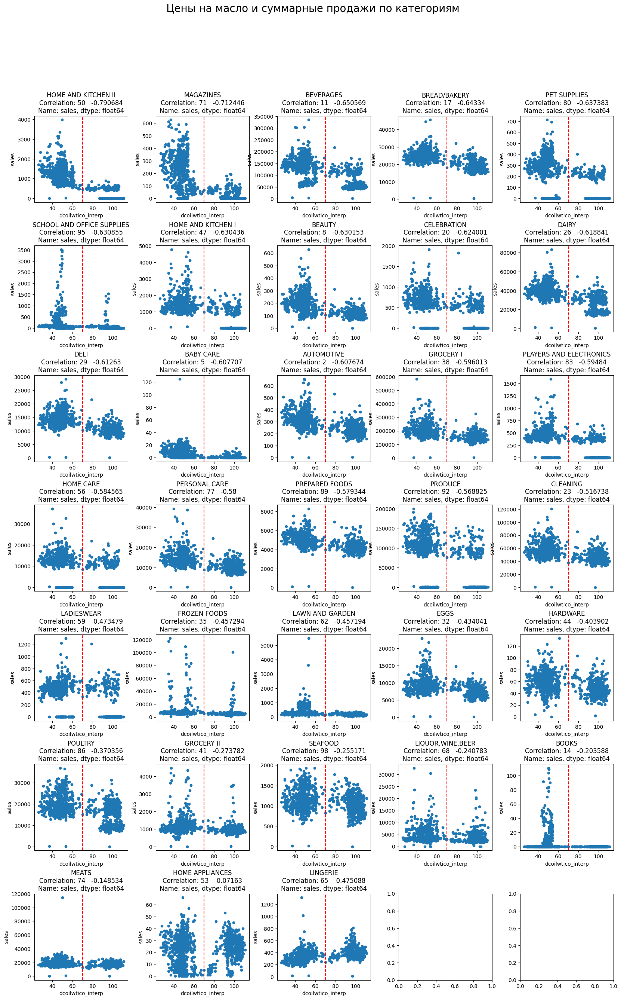

In [86]:
fig, axes = plt.subplots(7, 5, figsize=(20,30))
plt.subplots_adjust(wspace=0.3, hspace=0.5)
for (i, fam) in enumerate(families.family):
    sales_by_family[sales_by_family['family'] == fam].plot.scatter(x='dcoilwtico_interp', y='sales', ax=axes[i//5, i%5])
    axes[i//5, i%5].set_title(fam + '\n' + 'Correlation: ' + str(families[families['family'] == fam]['sales']), fontsize=12)
    axes[i//5, i%5].axvline(x=70, color='r', linestyle='--')
plt.suptitle("Цены на масло и суммарные продажи по категориям \n", fontsize = 20);
plt.show()

Заметно, что при падении цен на масло, общее количество продаж часто увеличивается

## Stores ##

In [91]:
# Вспомогательная функция
def plot_stats(df, column, ax, color, angle):
    count_classes = df[column].value_counts()
    ax = sns.barplot(x=count_classes.index, y=count_classes, ax=ax, palette=color)
    ax.set_title(column.upper(), fontsize=18)
    for tick in ax.get_xticklabels():
        tick.set_rotation(angle)

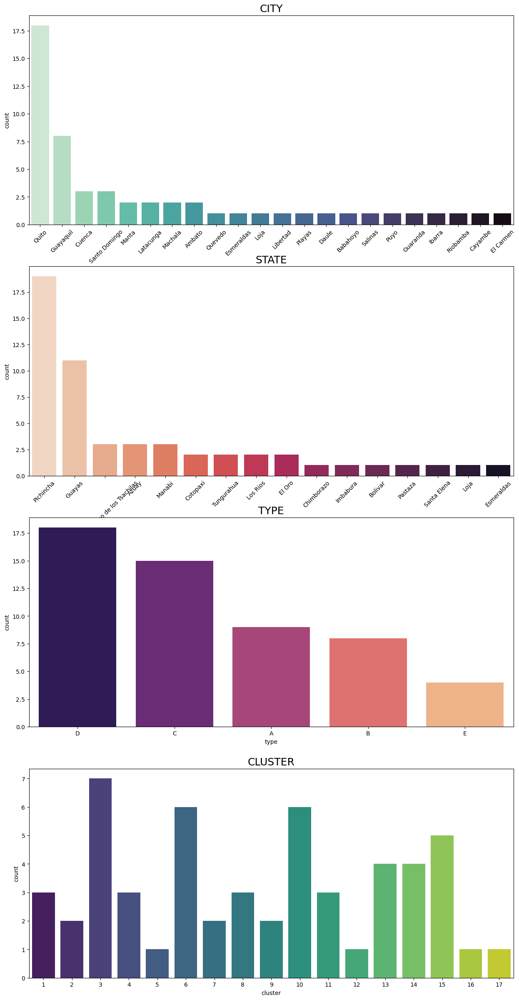

In [92]:
fig, axes = plt.subplots(4, 1, figsize=(15,30))
plot_stats(stores, "city", axes[0], "mako_r", 45)
plot_stats(stores, "state", axes[1], "rocket_r", 45)
plot_stats(stores, "type", axes[2], "magma", 0)
plot_stats(stores, "cluster", axes[3], "viridis", 0)
plt.show()

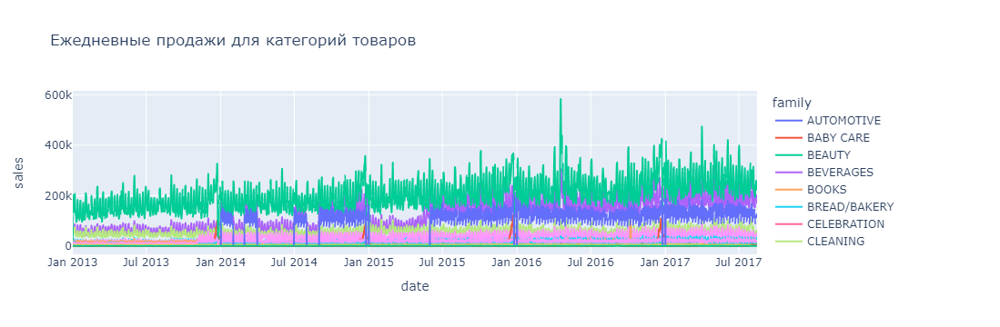

In [93]:
family_data_sales = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(family_data_sales, x = "date", y= "sales", color = "family", title = "Ежедневные продажи для категорий товаров")

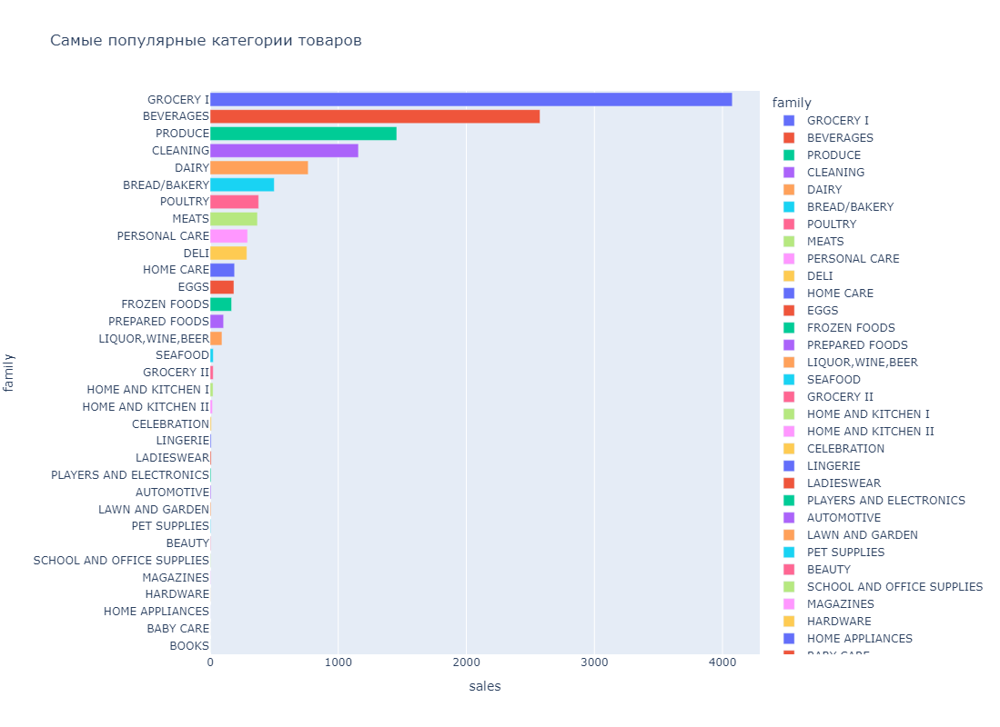

In [94]:
family_data_sales = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(family_data_sales, y = "family", x="sales", color = "family", title = "Самые популярные категории товаров", height=800)

In [95]:
print('Коэффициент Спирмена между onpromotion и продажами', train[['sales', 'onpromotion']].corr('spearman').sales.loc['onpromotion'])

Коэффициент Спирмена между onpromotion и продажами 0.5328877286580788


## Sales ##

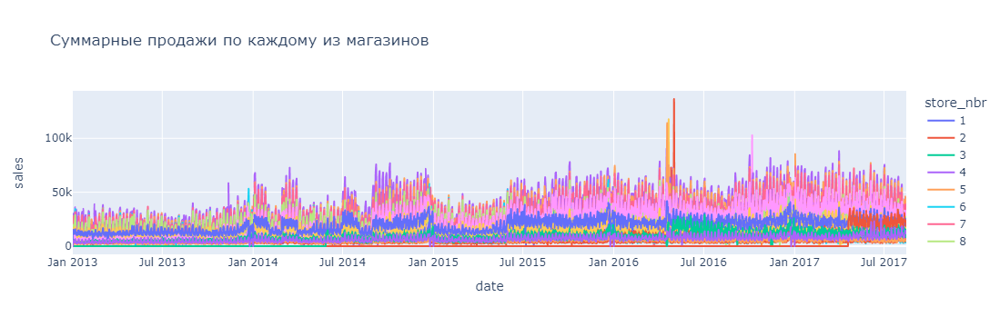

In [87]:
total_sales = train.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(total_sales, x = "date", y= "sales", color = "store_nbr", title = "Суммарные продажи по каждому из магазинов")

Посмотрим на данные по продажам для каждого из магазинов

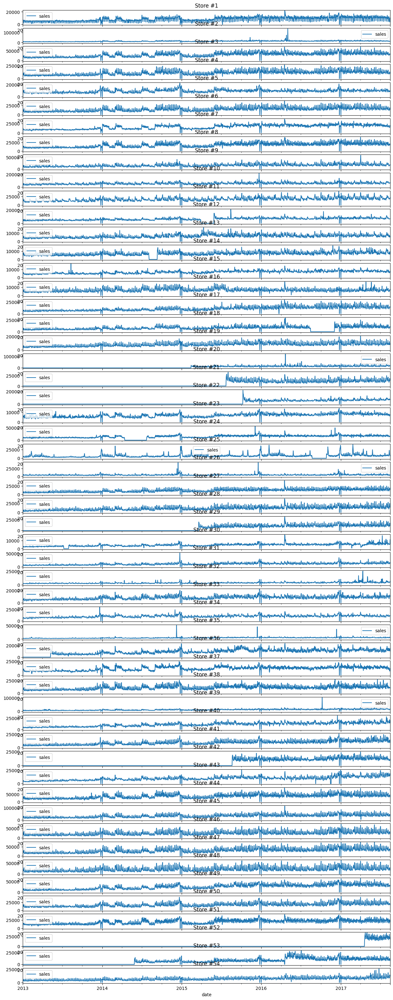

In [88]:
fig, axes = plt.subplots(54, 1, figsize=(15,40))
for store in range(1, 55):
    total_sales[total_sales['store_nbr'] == store].plot.line(x = "date", y= "sales", ax=axes[store-1])
    axes[store-1].set_title(f'Store #{store}')
    axes[store-1].set(label=None)
plt.show()

- Видим, что для магазинов №20, 21, 22, 29, 36, 42, 52, 53 данные появляются только с определенной даты
- Ненужные данные удалим

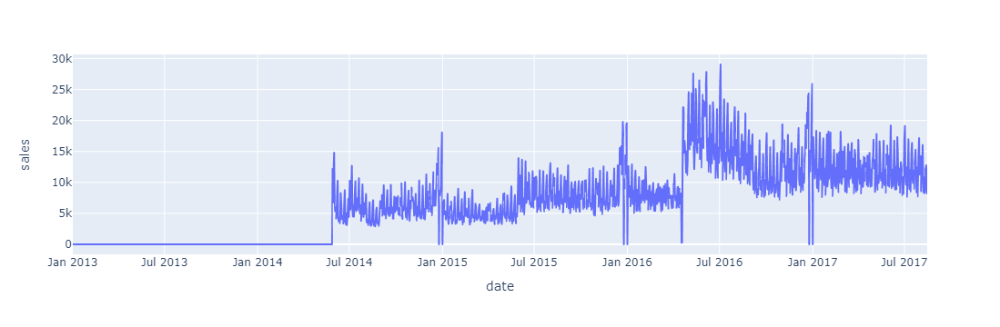

In [89]:
px.line(total_sales[total_sales['store_nbr'] == 53], x='date', y='sales')

In [90]:
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]

## Holidays ##

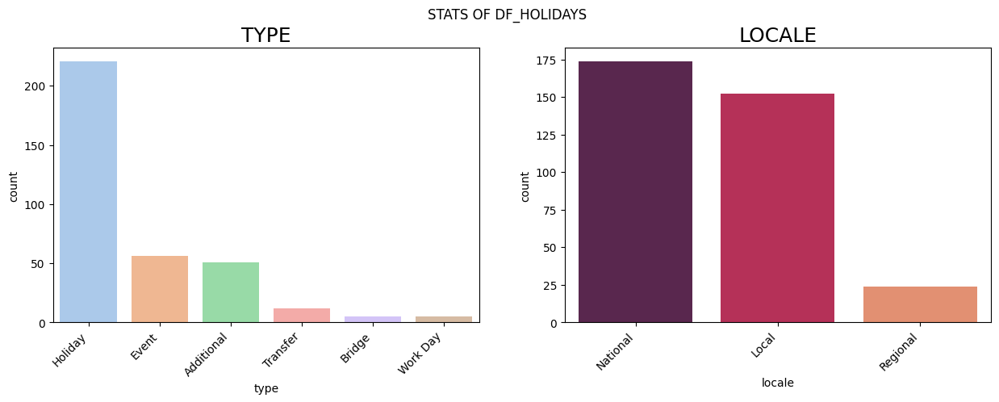

In [64]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
fig.autofmt_xdate()
fig.suptitle("Stats of df_holidays".upper())
plot_stats(holidays, "type", axes[0], "pastel", 45)
plot_stats(holidays, "locale", axes[1], "rocket", 45)
plt.show()

Распределение праздников по типу и региону

## Предсказание с XGBoostRegressor ##
Используя DirRec стратегию

In [65]:
store_sales = train.copy()
store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family', 'date']).sort_index()

family_sales = (
    store_sales
    .groupby(['family', 'date'])
    .mean()
    .unstack('family')
    .loc['2017']
)

In [66]:
test['date'] = test.date.dt.to_period('D')
test = test.set_index(['store_nbr', 'family', 'date']).sort_index()

In [67]:
def make_lags(ts, lags):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)

In [68]:
def make_multistep_target(ts, steps):
    return pd.concat(
        {f'y_step_{i + 1}': ts.shift(-i)
         for i in range(steps)},
        axis=1)

In [69]:
y = family_sales.loc[:, 'sales']

X = make_lags(y, lags=5).dropna()

y = make_multistep_target(y, steps=16).dropna()

y, X = y.align(X, join='inner', axis=0)

In [70]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
X = (X
    .stack('family')
    .reset_index('family')
    .assign(family=lambda x: le.fit_transform(x.family))
)
y = y.stack('family')

display(y) 

y_step_1     y_step_2     y_step_3  \
date       family                                                              
2017-01-06 AUTOMOTIVE                     6.018518    10.259259     9.388889   
           BABY CARE                      0.277778     0.259259     0.240741   
           BEAUTY                         6.518518    10.037037    11.611111   
           BEVERAGES                   3507.277832  4848.518555  5503.647949   
           BOOKS                          0.537037     0.481481     0.722222   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      364.955658   403.601349   377.313995   
           PREPARED FOODS                84.698647    87.836800    88.735970   
           PRODUCE                     2257.140625  2609.180176  3122.895752   
           SCHOOL AND OFFICE SUPPLIES    30.111111    49.333332    57.481480   
           SEAFOOD                       20.488333    20.346851    20.801037   

                                          y_step_4     y_step_5     y_step_6  \
date       family                                                              
2017-01-06 AUTOMOTIVE                     5.944445     4.777778     6.314815   
           BABY CARE                      0.444444     0.240741     0.277778   
           BEAUTY                         5.648148     6.500000     5.277778   
           BEVERAGES                   3448.203613  3171.740723  3046.870361   
           BOOKS                          0.500000     0.518519     0.481481   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      316.436096   533.497009   416.454041   
           PREPARED FOODS                77.172997    91.886765   100.384964   
           PRODUCE                     1792.220947  2079.319336  2418.970215   
           SCHOOL AND OFFICE SUPPLIES    51.907406    63.222221    85.203705   
           SEAFOOD                       17.116297    25.553965    24.209518   

                                          y_step_7     y_step_8     y_step_9  \
date       family                                                              
2017-01-06 AUTOMOTIVE                     5.388889     5.240741     8.500000   
           BABY CARE                      0.296296     0.296296     0.388889   
           BEAUTY                         4.370370     4.703704     7.777778   
           BEVERAGES                   2693.722168  3226.037109  4667.296387   
           BOOKS                          0.388889     0.444444     0.574074   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      464.596558   344.051758   313.780884   
           PREPARED FOODS               102.248146    86.627441    77.344131   
           PRODUCE                     2675.105957  2111.133301  2168.535400   
           SCHOOL AND OFFICE SUPPLIES   100.277779    64.407410    59.759258   
           SEAFOOD                       23.512852    18.419851    18.481131   

                                         y_step_10    y_step_11    y_step_12  \
date       family                                                              
2017-01-06 AUTOMOTIVE                    10.259259     6.407407     5.685185   
           BABY CARE                      0.425926     0.314815     0.166667   
           BEAUTY                         9.037037     5.648148     5.351852   
           BEVERAGES                   5580.611328  3700.370361  3409.796387   
           BOOKS                          0.555556     0.388889     0.500000   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      305.270172   278.819855   468.857391   
           PREPARED FOODS                84.796539    78.791443    96.286926   
           PRODUCE                     2663.076416  1670.264893  2198.854492   
           SCHOOL AND OFFICE SUPPLIES  

In [71]:
from sklearn.multioutput import RegressorChain
from xgboost import XGBRegressor

In [72]:
model = RegressorChain(base_estimator=XGBRegressor())

In [73]:
model.fit(X, y)
y_pred = pd.DataFrame(model.predict(X), index=y.index,columns=y.columns).clip(0.0)

In [74]:
def plot_multistep(y, every=1, ax=None, palette_kwargs=None):
    palette_kwargs_ = dict(palette='husl', n_colors=16, desat=None)
    if palette_kwargs is not None:
        palette_kwargs_.update(palette_kwargs)
    palette = sns.color_palette(**palette_kwargs_)
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_prop_cycle(plt.cycler('color', palette))
    for date, preds in y[::every].iterrows():
        preds.index = pd.period_range(start=date, periods=len(preds))
        preds.plot(ax=ax)
    return ax

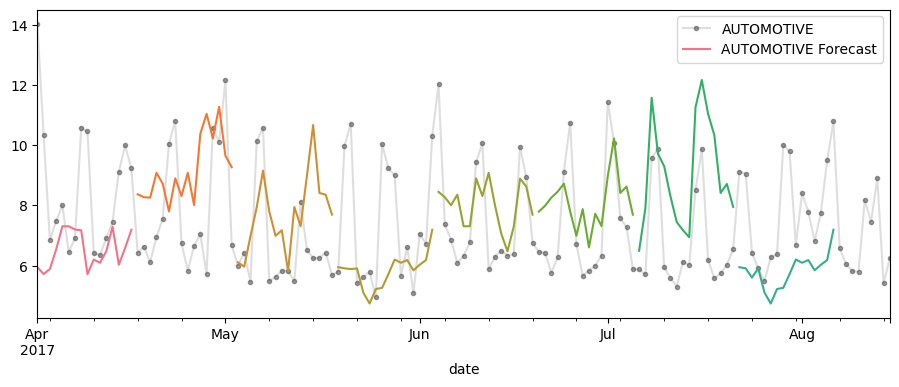

In [75]:
FAMILY = 'AUTOMOTIVE'
START = '2017-04-01'
EVERY = 16

y_pred_ = y_pred.xs(FAMILY, level='family', axis=0).loc[START:]
y_ = family_sales.loc[START:, 'sales'].loc[:, FAMILY]

fig, ax = plt.subplots(1, 1, figsize=(11, 4))
ax = y_.plot(color="0.75",style=".-",markeredgecolor="0.25", markerfacecolor="0.25",ax=ax, alpha=0.5)
ax = plot_multistep(y_pred_, ax=ax, every=EVERY)
_ = ax.legend([FAMILY, FAMILY + ' Forecast'])